In [ ]:
#@title Check GPU
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-cc81ad62-e410-4b96-7c10-c5f975168baf)


In [ ]:
import os, subprocess
from IPython.display import clear_output

In [ ]:
!pip install gradio
!pip install open_clip_torch
!pip install clip-interrogator

clear_output()

In [ ]:
exit()

In [ ]:
import requests
import gradio as gr
from PIL import Image
from clip_interrogator import Config, Interrogator

In [ ]:
caption_model_name = 'blip-large' #@param ["blip-base", "blip-large", "git-large-coco"]
clip_model_name = 'ViT-H-14/laion2b_s32b_b79k' #@param ["ViT-L-14/openai", "ViT-H-14/laion2b_s32b_b79k"]

In [ ]:
config = Config()

In [ ]:
config.clip_model_name = clip_model_name
config.caption_model_name = caption_model_name

In [ ]:
ci = Interrogator(config)

Loading caption model blip-large...


config.json:   0%|          | 0.00/4.60k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/445 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/527 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

Loading CLIP model ViT-H-14/laion2b_s32b_b79k...


open_clip_pytorch_model.bin:   0%|          | 0.00/3.94G [00:00<?, ?B/s]

ViT-H-14_laion2b_s32b_b79k_artists.safetensors: 100%|██████████| 21.6M/21.6M [00:02<00:00, 9.16MB/s]
ViT-H-14_laion2b_s32b_b79k_flavors.safetensors: 100%|██████████| 207M/207M [00:11<00:00, 17.7MB/s]
ViT-H-14_laion2b_s32b_b79k_mediums.safetensors: 100%|██████████| 195k/195k [00:00<00:00, 331kB/s]
ViT-H-14_laion2b_s32b_b79k_movements.safetensors: 100%|██████████| 410k/410k [00:00<00:00, 524kB/s]
ViT-H-14_laion2b_s32b_b79k_trendings.safetensors: 100%|██████████| 148k/148k [00:00<00:00, 252kB/s]
ViT-H-14_laion2b_s32b_b79k_negative.safetensors: 100%|██████████| 84.2k/84.2k [00:00<00:00, 216kB/s]

Loaded CLIP model and data in 87.57 seconds.


In [ ]:
def image_analysis(image):
    image = image.convert('RGB')
    image_features = ci.image_to_features(image)

    top_mediums = ci.mediums.rank(image_features, 5)
    top_artists = ci.artists.rank(image_features, 5)
    top_movements = ci.movements.rank(image_features, 5)
    top_trendings = ci.trendings.rank(image_features, 5)
    top_flavors = ci.flavors.rank(image_features, 5)

    medium_ranks = {medium: sim for medium, sim in zip(top_mediums, ci.similarities(image_features, top_mediums))}
    artist_ranks = {artist: sim for artist, sim in zip(top_artists, ci.similarities(image_features, top_artists))}
    movement_ranks = {movement: sim for movement, sim in zip(top_movements, ci.similarities(image_features, top_movements))}
    trending_ranks = {trending: sim for trending, sim in zip(top_trendings, ci.similarities(image_features, top_trendings))}
    flavor_ranks = {flavor: sim for flavor, sim in zip(top_flavors, ci.similarities(image_features, top_flavors))}

    return medium_ranks, artist_ranks, movement_ranks, trending_ranks, flavor_ranks

def image_to_prompt(image, mode):
    ci.config.chunk_size = 2048 if ci.config.clip_model_name == "ViT-L-14/openai" else 1024
    ci.config.flavor_intermediate_count = 2048 if ci.config.clip_model_name == "ViT-L-14/openai" else 1024
    image = image.convert('RGB')
    if mode == 'best':
        return ci.interrogate(image)
    elif mode == 'classic':
        return ci.interrogate_classic(image)
    elif mode == 'fast':
        return ci.interrogate_fast(image)
    elif mode == 'negative':
        return ci.interrogate_negative(image)

In [ ]:
image_path_or_url = "https://cdnb.artstation.com/p/assets/images/images/032/142/769/large/ignacio-bazan-lazcano-book-4-final.jpg" #@param {type:"string"}

if str(image_path_or_url).startswith('http://') or str(image_path_or_url).startswith('https://'):
    image = Image.open(requests.get(image_path_or_url, stream=True).raw).convert('RGB')

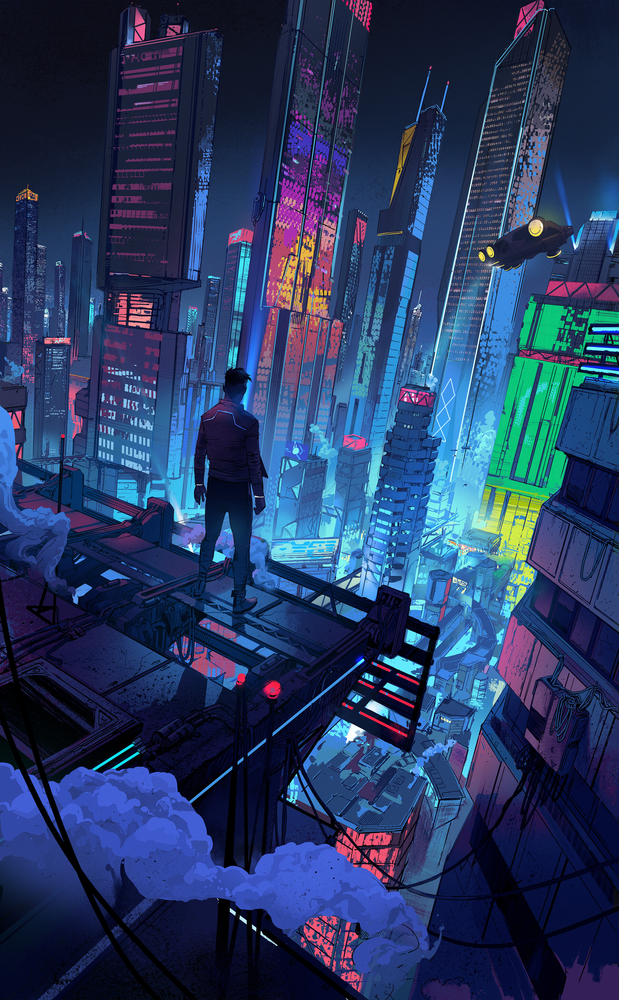

In [ ]:
image

In [25]:
modes = ['best', 'fast', 'classic', 'negative']

prompt_best = image_to_prompt(image, modes[0])
prompt_best

100%|██████████| 50/50 [00:00<00:00, 202.01it/s]


'cyber city with a man standing on a ledge looking at the city, cyberpunk colors, cyberpunk signs, lowres, futuristic but colorful shading, very epic atmosphere, inspired by Andrei Kolkoutine, full res, anton fadeev and dan mumford, neonpunk, looking over city, arstation and beeple highly'

In [26]:
prompt_fast = image_to_prompt(image, modes[1])
prompt_fast

100%|██████████| 110/110 [00:00<00:00, 387.37it/s]


'cyber city with a man standing on a ledge looking at the city, cyberpunk art style, in a futuristic cyberpunk city, detailed neon cyberpunk city, cyberpunk dreamscape, digital cyberpunk anime art, detailed cyberpunk illustration, cyberpunk themed art, cyberpunk cityscape, cyberpunk blade runner art, cyberpunk illustration, cyberpunk pixel art, in cyberpunk city, busy cyberpunk metropolis, futuristic cyberpunk tokyo night'

In [27]:
prompt_classic = image_to_prompt(image, modes[2])
prompt_classic

100%|██████████| 50/50 [00:00<00:00, 207.88it/s]


'cyber city with a man standing on a ledge looking at the city, cyberpunk art inspired by Liam Wong, trending on cgsociety, digital art, cyberpunk art style, in a futuristic cyberpunk city, detailed neon cyberpunk city'

In [28]:
prompt_negative = image_to_prompt(image, modes[3])
prompt_negative

Negative chain:  34%|███▍      | 11/32 [00:45<01:25,  4.09s/it]


'1 8 8 0 photograph, wearing a laurel wreath, wearing a sun dress, botanical herbarium, no makeup, chateau de cheverny, maryport, famous actresses, calotype, classical greece, beautiful smiling face, hair ornaments'

In [29]:
image_path_or_url = "https://user-images.githubusercontent.com/33302880/284758167-367a25d8-8d7b-42d3-8391-6d82813c7b0f.png" #@param {type:"string"}

if str(image_path_or_url).startswith('http://') or str(image_path_or_url).startswith('https://'):
    image = Image.open(requests.get(image_path_or_url, stream=True).raw).convert('RGB')

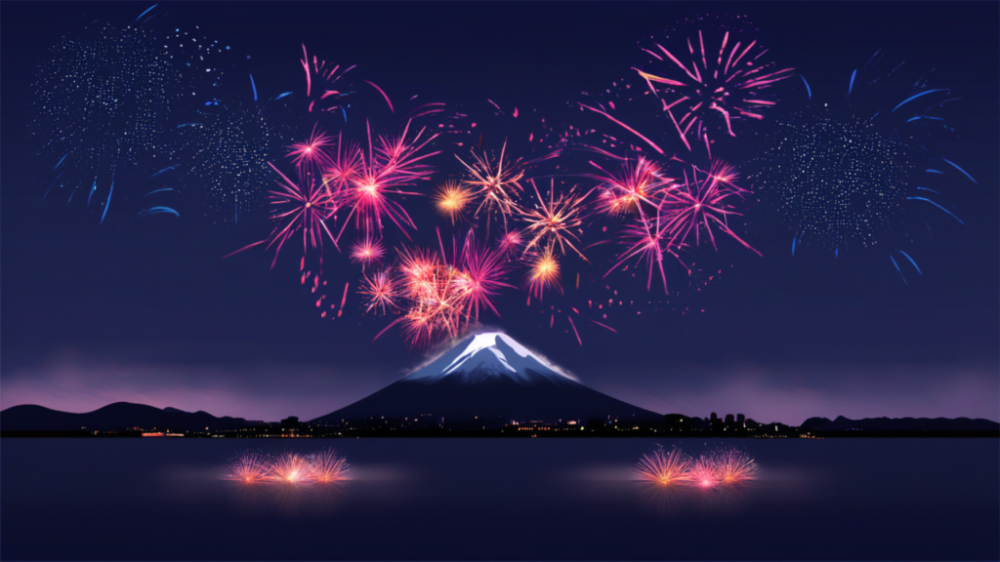

In [30]:
image

In [31]:
prompt_best = image_to_prompt(image, modes[0])
prompt_best

100%|██████████| 50/50 [00:00<00:00, 197.44it/s]


'fireworks are lit up in the sky above a mountain and lake, mountain fuji on the background, 4 k hd wallpaper illustration, lowres, hyperdetailed illustration, vectorial, drawn with photoshop, 4 k illustration, japan shonan enoshima, very detailed illustration, final result, russian and japanese mix, celebration, by Matsumura Goshun, beautiful day, displayed'

In [32]:
prompt_fast = image_to_prompt(image, modes[1])
prompt_fast

100%|██████████| 110/110 [00:00<00:00, 365.43it/s]


"fireworks are lit up in the sky above a mountain and lake, [ fireworks in the sky ]!!, mount fuji background, fireworks in background, fireworks in the background, mount fuji on the background, fireworks on the background, happy!!!, firework, fireworks, mt. fuji, mountain fuji on the background, amazing background, magnificent background, by Nishida Shun'ei"

In [33]:
prompt_classic = image_to_prompt(image, modes[2])
prompt_classic

100%|██████████| 50/50 [00:00<00:00, 206.08it/s]


"fireworks are lit up in the sky above a mountain and lake, vector art by Nishida Shun'ei, shutterstock, ukiyo-e, [ fireworks in the sky ]!!, mount fuji background, fireworks in background"

In [34]:
prompt_negative = image_to_prompt(image, modes[3])
prompt_negative

Negative chain:  44%|████▍     | 14/32 [00:56<01:12,  4.05s/it]


'brutalist fashion show, josef sudek, apartment hallway, portrait of a beautiful model, in a monestry natural lighting, barcelona in 1 9 1 8, wearing stockings, shadow cast of dark corridor, lucien freud, b&w, 1 9 5 0 s scrambler, grey striped walls, dress made of bones, head is an egg, disgusting'

In [35]:
image_path_or_url = "https://buffer.com/cdn-cgi/image/w=1000,fit=contain,q=90,f=auto/library/content/images/size/w600/2023/10/free-images.jpg" #@param {type:"string"}

if str(image_path_or_url).startswith('http://') or str(image_path_or_url).startswith('https://'):
    image = Image.open(requests.get(image_path_or_url, stream=True).raw).convert('RGB')

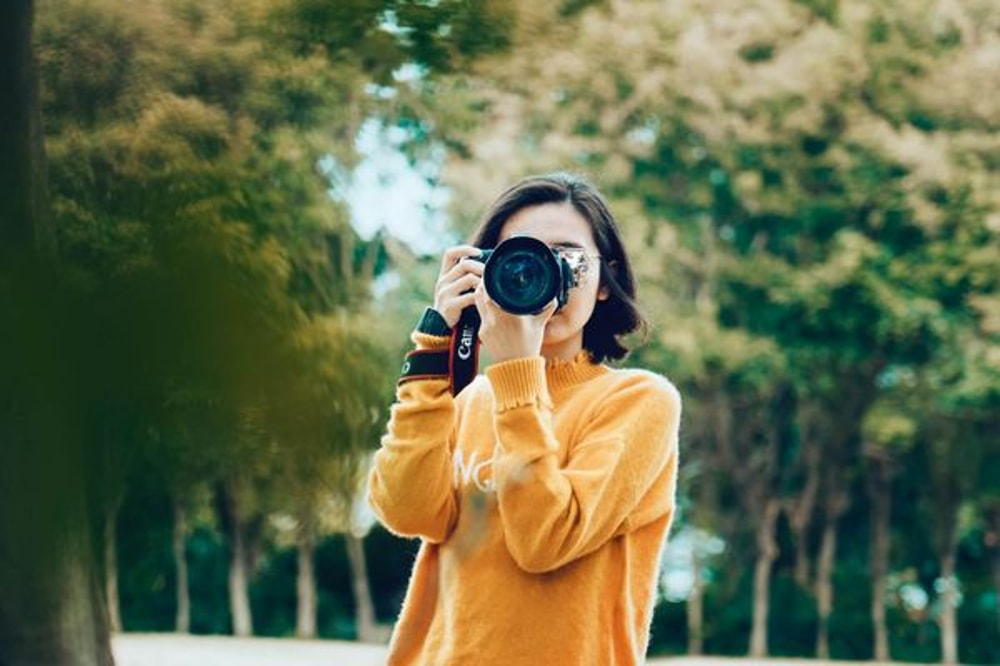

In [36]:
image

In [37]:
prompt_best = image_to_prompt(image, modes[0])
prompt_best

100%|██████████| 50/50 [00:00<00:00, 196.69it/s]


'araffe woman taking a picture of a tree with a camera, on a yellow canva, photo pinterest, holding a dslr camera, professional photography 1 6 k, asian woman, photograph”, wearing a yellow hoodie, auto photography, phot'

In [38]:
prompt_fast = image_to_prompt(image, modes[1])
prompt_fast

100%|██████████| 110/110 [00:00<00:00, 359.91it/s]


'araffe woman taking a picture of a tree with a camera, female photography, holding a camera, photography], photography style, professional photography, taking a picture, photography hight quality, colored photography, holding nikon camera, photography portrait 4 k, dslr photograpy, photgraphy, photography 50mm f1.4, phography, holding a dslr camera'

In [39]:
prompt_classic = image_to_prompt(image, modes[2])
prompt_classic

100%|██████████| 50/50 [00:00<00:00, 196.98it/s]


'araffe woman taking a picture of a tree with a camera, a picture inspired by Elsa Bleda, unsplash contest winner, art photography, female photography, holding a camera, photography]'

In [40]:
prompt_negative = image_to_prompt(image, modes[3])
prompt_negative

Negative chain:  53%|█████▎    | 17/32 [01:07<00:59,  3.95s/it]


'dark city ruins, blizzard concept artist, reinhardt from overwatch, dragon leg, greg rutkowski and james gurney, brain in a vat!!, absurdly muscular physique, space elevator, fireworks on the background, demon wings, chaos marine, hearthstone style art, snake heads, boris villajo, nightmare render, magic doorway, ancient fish, exquisitely designed throne room'

In [42]:
image_path_or_url = "https://media.istockphoto.com/id/1146517111/photo/taj-mahal-mausoleum-in-agra.jpg?s=612x612&w=0&k=20&c=vcIjhwUrNyjoKbGbAQ5sOcEzDUgOfCsm9ySmJ8gNeRk=" #@param {type:"string"}

if str(image_path_or_url).startswith('http://') or str(image_path_or_url).startswith('https://'):
    image = Image.open(requests.get(image_path_or_url, stream=True).raw).convert('RGB')

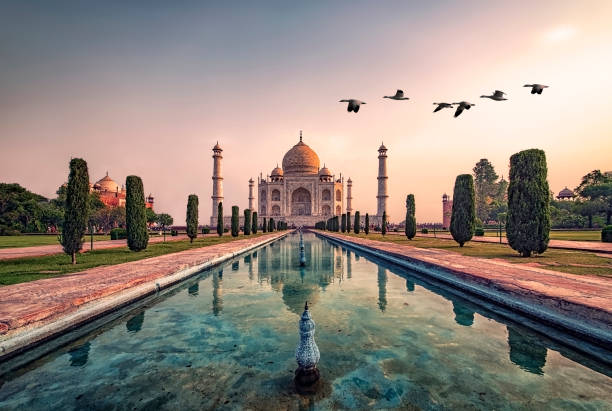

In [43]:
image

In [44]:
prompt_best = image_to_prompt(image, modes[0])
prompt_best

100%|██████████| 50/50 [00:00<00:00, 91.63it/s]


'arafed view of a water feature with birds flying over it, taj mahal, shutterstock, cinematic silk road lanscape, city morning, 2 0 2 2 photo, beautiful eden garden, helicopters and tremendous birds, marvellous reflection of the sky, bollywood, road trip, elegant and ornate, avalon, swan, vacation photo, istockphoto, elegant high art'

In [45]:
prompt_fast = image_to_prompt(image, modes[1])
prompt_fast

100%|██████████| 110/110 [00:00<00:00, 363.47it/s]


'arafed view of a water feature with birds flying over it, taj mahal, incredibly beautiful, india, shutterstock, beautiful place, indian temple, istock, mesmerising, travel, beautiful futuristic new delhi, in a city with a rich history, with beautiful mosques, very beautiful photo, top, in majestic, palace floating in the sky, serene scene'

In [46]:
prompt_classic = image_to_prompt(image, modes[2])
prompt_classic

100%|██████████| 50/50 [00:00<00:00, 202.50it/s]


'arafed view of a water feature with birds flying over it, a marble sculpture by Joseph Werner, shutterstock, arabesque, taj mahal, incredibly beautiful, india'

In [47]:
prompt_negative = image_to_prompt(image, modes[3])
prompt_negative

Negative chain:  47%|████▋     | 15/32 [01:00<01:08,  4.03s/it]


'wintry rumpelstiltskin, chibi style, poorly drawn, tyler durden, character portrait, b&w, phil hale and kent williams, as a d & d monster, joe madureira, gurren lagann, ink on paper, pirate flag in his arms, led - lit armor, dark wood, screaming fashion model face, big biceps'